

This dataset contains banking marketing campaign data and we can use it to optimize marketing campaigns to attract more customers to term deposit subscription.

What is a Term Deposit?

A Term deposit is a deposit that a bank or a financial institution offers with a fixed rate (often better than just opening deposit account) in which your money will be returned back at a specific maturity time.



In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

In [10]:
bank_deposit = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/bank.csv")
bank_deposit.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes


In [11]:
bank_deposit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB


In [12]:
!pip install pandas-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.2/356.2 kB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 29.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 48.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 86.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=a3fdde9a0c8d9ad36ea244b38350f54ba391366c80327ee40d225e3aa72f28a3
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [13]:
#To Create a pandas profiling reports to gain insights into the dataset
#Use ydata-profiling to generate a report of the provided dataset
import pandas as pd
from ydata_profiling import ProfileReport
bank_deposit = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/bank.csv")

In [24]:
profile = ProfileReport(bank_deposit, title="Deposti")
profile.to_widgets()

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:533: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
bank_deposit.describe()

,age,balance,day,duration,campaign,pdays,previous
count,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000
mean,41.231948,1528.538524,15.658036,371.993818,2.508421,51.330407,0.832557
std,11.913369,3225.413326,8.420740,347.128386,2.722077,108.758282,2.292007
min,18.000000,-6847.000000,1.000000,2.000000,1.000000,-1.000000,0.000000
25%,32.000000,122.000000,8.000000,138.000000,1.000000,-1.000000,0.000000
50%,39.000000,550.000000,15.000000,255.000000,2.000000,-1.000000,0.000000
75%,49.000000,1708.000000,22.000000,496.000000,3.000000,20.750000,1.000000
max,95.000000,81204.000000,31.000000,3881.000000,63.000000,854.000000,58.000000


In [26]:
bank_deposit.isnull().sum()

,0
age,0
job,0
marital,0
education,0
default,0
balance,0
housing,0
loan,0
contact,0
day,0


In [27]:
bank_deposit.duplicated().sum()

0

In [28]:
bank_deposit.shape

(11162, 17)

In [29]:
bank_deposit.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'deposit'],
      dtype='object')

In [30]:
categorical_columns = bank_deposit.select_dtypes(include='object').columns
print(categorical_columns)

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'poutcome', 'deposit'],
      dtype='object')


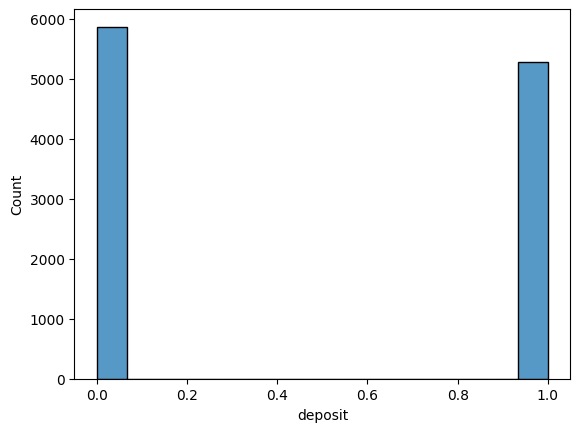

In [74]:
sns.histplot(bank_deposit['deposit'])
plt.show()

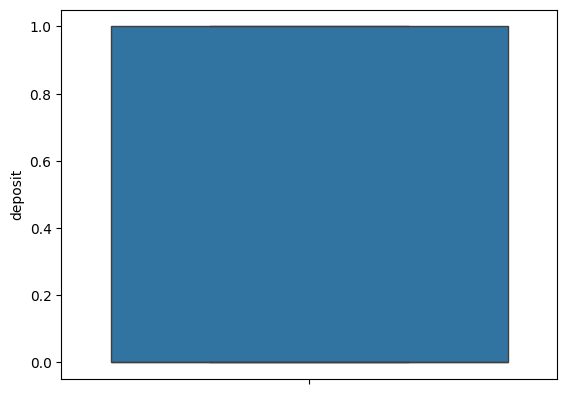

In [77]:
sns.boxplot(bank_deposit['deposit'])
plt.show()

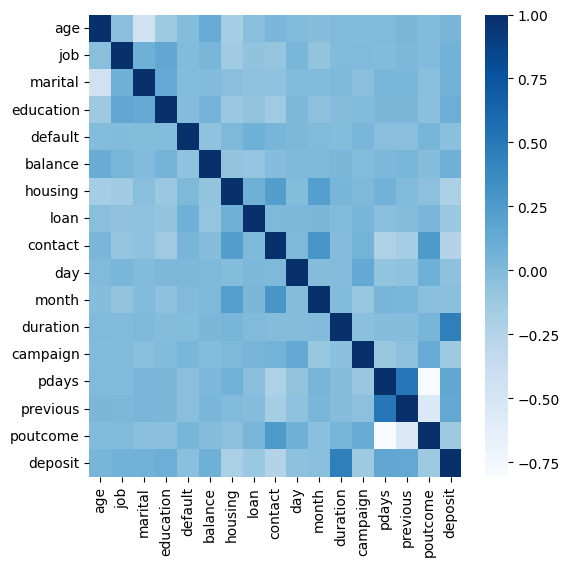

In [72]:
plt.figure(figsize=(6, 6))
sns.heatmap(bank_deposit.corr(),cmap='Blues') # use a period to call the heatmap function from the sns library
plt.show()

In [38]:
# Convert categorical data to numerical data using lebel encoding
from sklearn import preprocessing
lebel = preprocessing.LabelEncoder()


In [39]:
bank_enc= bank_deposit.select_dtypes(include=['object']).columns
for column in bank_enc: # Convert Categorical Data to Numerical
    bank_deposit[column] = lebel.fit_transform(bank_deposit[column]) # Use lebel instead of Label
bank_deposit.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,0,1,1,0,2343,1,0,2,5,8,1042,1,-1,0,3,1
1,56,0,1,1,0,45,0,0,2,5,8,1467,1,-1,0,3,1
2,41,9,1,1,0,1270,1,0,2,5,8,1389,1,-1,0,3,1
3,55,7,1,1,0,2476,1,0,2,5,8,579,1,-1,0,3,1
4,54,0,1,2,0,184,0,0,2,5,8,673,2,-1,0,3,1


In [40]:
bank_deposit.corr()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
age,1.000000,-0.031603,-0.442782,-0.126018,-0.011425,0.112300,-0.168700,-0.031418,0.027762,-0.000762,-0.026130,0.000189,-0.005278,0.002774,0.020169,-0.002699,0.034901
job,-0.031603,1.000000,0.078314,0.147046,-0.007066,0.028736,-0.136965,-0.067092,-0.087915,0.026589,-0.076011,0.002432,0.003104,-0.003385,0.012665,-0.004238,0.063395
marital,-0.442782,0.078314,1.000000,0.125845,-0.014691,-0.002138,-0.036345,-0.062029,-0.060456,-0.003642,-0.004070,0.006781,-0.030794,0.031200,0.031281,-0.039424,0.067610
education,-0.126018,0.147046,0.125845,1.000000,-0.010709,0.051728,-0.109168,-0.073154,-0.132540,0.016759,-0.055868,-0.019122,-0.005327,0.025165,0.022427,-0.040262,0.095948
default,-0.011425,-0.007066,-0.014691,-0.010709,1.000000,-0.060954,0.011076,0.076434,0.035709,0.017342,0.000950,-0.009760,0.030975,-0.036282,-0.035273,0.042357,-0.040680
balance,0.112300,0.028736,-0.002138,0.051728,-0.060954,1.000000,-0.077092,-0.084589,-0.027295,0.010467,0.007264,0.022436,-0.013894,0.017411,0.030805,-0.027151,0.081129
housing,-0.168700,-0.136965,-0.036345,-0.109168,0.011076,-0.077092,1.000000,0.076761,0.226392,-0.014770,0.219602,0.035051,0.006660,0.064497,-0.000840,-0.046370,-0.203888
loan,-0.031418,-0.067092,-0.062029,-0.073154,0.076434,-0.084589,0.076761,1.000000,0.006829,0.017269,0.025329,-0.001914,0.034722,-0.030416,-0.022668,0.026344,-0.110580
contact,0.027762,-0.087915,-0.060456,-0.132540,0.035709,-0.027295,0.226392,0.006829,1.000000,0.007943,0.289803,-0.018000,0.059258,-0.227785,-0.169919,0.257993,-0.249847
day,-0.000762,0.026589,-0.003642,0.016759,0.017342,0.010467,-0.014770,0.017269,0.007943,1.000000,-0.019840,-0.018511,0.137007,-0.077232,-0.058981,0.080221,-0.056326


In [41]:
!pip install imbalanced-learn

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Define features and target
#features = ['duration','campaign','pdays','previous','balance','education','job','marital','housing','loan','contact']
#x = bank_deposit[features]
#y = bank_deposit['deposit']

In [43]:
features = ['age', 'job', 'marital', 'education', 'default', 'balance', 'housing', 'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays', 'previous', 'poutcome'] # Added the missing features
x = bank_deposit[features]
y = bank_deposit['deposit']

In [44]:
#Split Dataset into Training and Test Sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=55)

In [45]:
# Apply SMOTE to the training data only
smote = SMOTE(random_state=55)
x_train_resampled, y_train_resampled = smote.fit_resample(x_train, y_train)


In [46]:
# Standardize data to avoid high variations in the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = scaler.fit_transform(x)

In [55]:
model = LogisticRegression() # Instantiate model
model.fit(x_train, y_train) # Fit or train model with train dataset using X_train

LogisticRegression()

In [48]:
#fitting our model
model = LogisticRegression()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)

# evaluating our model
print("score:{} ".format(accuracy_score(y_test, y_pred)))
print("matrix:{}".format(confusion_matrix(y_test, y_pred)))
print("report:{} ".format(classification_report(y_test, y_pred)))


score:0.7469771607702642 
matrix:[[918 230]
 [335 750]]
report:              precision    recall  f1-score   support

           0       0.73      0.80      0.76      1148
           1       0.77      0.69      0.73      1085

    accuracy                           0.75      2233
   macro avg       0.75      0.75      0.75      2233
weighted avg       0.75      0.75      0.75      2233
 


In [62]:
# Instantiate model
rf = RandomForestClassifier()
rf.fit(x_train, y_train)

RandomForestClassifier()

In [63]:
#fitting our model
rf = RandomForestClassifier()
rf.fit(x_train, y_train)
y_pred = rf.predict(x_test)

# evaluating our model
print("score:{} ".format(accuracy_score(y_test, y_pred)))
print("matrix:{}".format(confusion_matrix(y_test, y_pred)))
print("report:{} ".format(classification_report(y_test, y_pred)))

score:0.8378862516793552 
matrix:[[946 202]
 [160 925]]
report:              precision    recall  f1-score   support

           0       0.86      0.82      0.84      1148
           1       0.82      0.85      0.84      1085

    accuracy                           0.84      2233
   macro avg       0.84      0.84      0.84      2233
weighted avg       0.84      0.84      0.84      2233
 


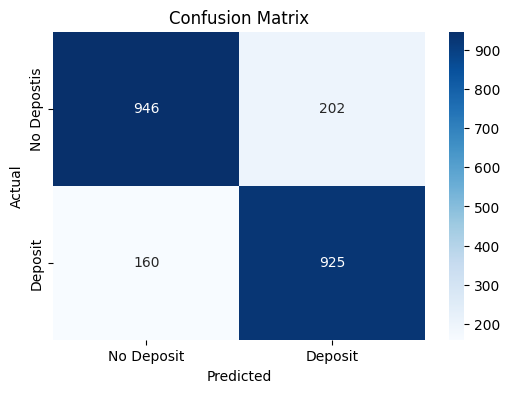

In [64]:
 #Compute the confusion matrix
confusion_matrix = confusion_matrix(y_test, y_pred)

# Plotting the confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No Deposit', 'Deposit'], yticklabels=['No Depostis', 'Deposit'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Summary:

The model has a good overall accuracy of 84%.
It performs similarly well for both classes (0 and 1), with similar precision, recall, and F1-scores.
The confusion matrix gives a more detailed breakdown of the types of errors made by the model.
The relatively high precision and recall values indicate that the model is doing a good job of identifying both positive and negative cases.

In [ ]:
!pip install pypickle

In [65]:
import pickle

# Save the model
with open('Bank_deposit_model.pkl', 'wb') as f:
    pickle.dump(model, f)


In [68]:
#from torch.utils.data import Dataset
from torch.utils.data import Dataset
class CustomDataset(Dataset):
    def __init__(self, data, labels):
        self.data = bank_deposit.iloc[:, 0:16].values
        self.labels = labels

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx], self.labels[idx]

In [70]:
labels = bank_deposit['deposit']

dataset = CustomDataset(bank_deposit, labels)

# Now you can create the dataset
dataset = CustomDataset(bank_deposit, labels)

In [71]:
# Prepare custom data
custom_data = [
          	[59, 0, 1, 1, 0, 2343,	1, 0, 2, 5, 8, 1042, 1, -1, 0,	3],
	          [56, 0,	1, 1,	0,   45,	0, 0,	2, 5,	8, 1467, 1, -1, 0,	3],
	          [41, 9,	1, 1,	0, 1270,	1, 0,	2, 5,	8, 1389, 1, -1, 0,	3],
            [55, 7,	1, 1,	0, 2476,	1, 0,	2, 5,	8,	579, 1, -1, 0,	3],
	          [54, 0,	1, 2,	0,  184,	0, 0,	2, 5,	8,	673, 2, -1, 0,	3]
]
# Ensure features has the correct columns, the names and number should match your custom_data
features = ['age', 'job', 'marital', 'education', 'default', 'balance', 'housing', 'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays', 'previous', 'poutcome']

# Convert to pandas DataFrame
custom_df = pd.DataFrame(custom_data, columns=features)

# Standardize the custom data
custom_X = scaler.transform(custom_df[features])

# Use the fitted model object (`model`) to predict on the custom data
custom_predictions = model.predict(custom_X) # Changed from LogisticRegression.transform(custom_X)

# Print the predictions
for i, pred in enumerate(custom_predictions):
    if pred == 0:
        print(f"Customer {i+1} The customer did not deposit")
    else:
        print(f"Customer {i+1} The customer deposit.")

Customer 1 The customer did not deposit
Customer 2 The customer did not deposit
Customer 3 The customer did not deposit
Customer 4 The customer did not deposit
Customer 5 The customer did not deposit
